In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly as py
import plotly.express as px
import numpy as np
import gmaps
import gmaps.datasets 
from folium import Map
from folium.plugins import HeatMap
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
import warnings
warnings.filterwarnings('ignore')

# Because of the size of the dataset we must store the dataset in googlebigquery and then take the data as needed for our analysis

In [2]:
#Set environment variables for your notebook
import pyarrow 
import os 
os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = '/Users/amandamanfredo/Downloads/liquor_data.json'
#Imports google cloud client library and initiates BQ service
from google.cloud import bigquery
bigquery_client = bigquery.Client()
#Write Query on BQ
QUERY = """
SELECT date,store_number,store_name,address,city,zip_code,store_location,
county,category_name,vendor_number,vendor_name,item_description,pack,
bottle_volume_ml,state_bottle_cost,state_bottle_retail,bottles_sold,
sale_dollars,volume_sold_liters
FROM `bigquery-public-data.iowa_liquor_sales.sales` 
WHERE  (date>='2012-01-01' AND date<'2022-03-01') AND store_name LIKE '%Hy-Vee%'
ORDER BY rand()
LIMIT 100000
  """
#Run the query and write result to a pandas data frame
Query_Results = bigquery_client.query(QUERY)
df = Query_Results.to_dataframe()
#View top few rows of result
df.head()

,date,store_number,store_name,address,city,zip_code,store_location,county,category_name,vendor_number,vendor_name,item_description,pack,bottle_volume_ml,state_bottle_cost,state_bottle_retail,bottles_sold,sale_dollars,volume_sold_liters
0,2016-12-08,2648,Hy-Vee #4 / Wdm,555 S 51st St,West Des Moines,50265,POINT (-93.773557 41.561197),POLK,Canadian Whiskies,55.0,SAZERAC NORTH AMERICA,Canadian Ltd Whisky,6,1750,9.14,13.71,6,75.06,10.50
1,2017-04-10,2575,Hy-Vee Food Store #1 / Waterloo,2834 Ansborough Ave,Waterloo,50702.0,POINT (-92.37662400000002 42.471767),BLACK HAWK,Cocktails /RTD,112,AMERICAN VINTAGE BEVERAGE,TGIFridays Ultimate Mudslide,6,1750,7.52,11.28,6,67.68,10.50
2,2018-04-26,2544,Hy-Vee Food Store / Marshalltown,802 South Center,Marshalltown,50158.0,POINT (-92.912817 42.039205),MARSHALL,Whiskey Liqueur,421,SAZERAC COMPANY INC,Fireball Cinnamon Whiskey,12,1000,11.34,17.01,12,204.12,12.00
3,2015-11-09,2588,Hy-Vee Food and Drug #6 / Cedar Rapi,4035 MT. VERNON ROAD S.E.,CEDAR RAPIDS,52403,POINT (-91.60978 41.976835),Linn,WHISKEY LIQUEUR,85.0,Brown-Forman Corporation,Southern Comfort Mini,12,500,4.71,7.07,1,7.07,0.50
4,2021-04-06,2651,Hy-Vee / Waverly,1311 4 Street SW,Waverly,50677.0,POINT (-92.475403 42.712263),BREMER,American Schnapps,65.0,Jim Beam Brands,Dekuyper Luscious Peachtree,12,750,6.50,9.75,3,29.25,2.25


In [3]:
df.shape

(100000, 19)

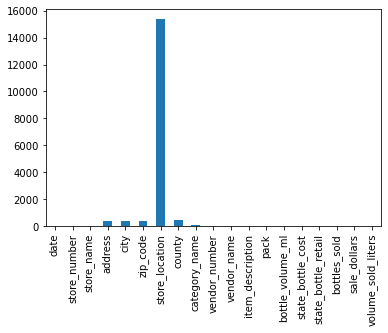

In [4]:
df.isna().sum().plot.bar(); 

In [5]:
#the dataframe is large enough that we can ignore null values and still have plenty of useful data to analyze
df.dropna(inplace=True)
df.drop_duplicates()

,date,store_number,store_name,address,city,zip_code,store_location,county,category_name,vendor_number,vendor_name,item_description,pack,bottle_volume_ml,state_bottle_cost,state_bottle_retail,bottles_sold,sale_dollars,volume_sold_liters
0,2016-12-08,2648,Hy-Vee #4 / Wdm,555 S 51st St,West Des Moines,50265,POINT (-93.773557 41.561197),POLK,Canadian Whiskies,55.0,SAZERAC NORTH AMERICA,Canadian Ltd Whisky,6,1750,9.14,13.71,6,75.06,10.50
1,2017-04-10,2575,Hy-Vee Food Store #1 / Waterloo,2834 Ansborough Ave,Waterloo,50702.0,POINT (-92.37662400000002 42.471767),BLACK HAWK,Cocktails /RTD,112,AMERICAN VINTAGE BEVERAGE,TGIFridays Ultimate Mudslide,6,1750,7.52,11.28,6,67.68,10.50
2,2018-04-26,2544,Hy-Vee Food Store / Marshalltown,802 South Center,Marshalltown,50158.0,POINT (-92.912817 42.039205),MARSHALL,Whiskey Liqueur,421,SAZERAC COMPANY INC,Fireball Cinnamon Whiskey,12,1000,11.34,17.01,12,204.12,12.00
3,2015-11-09,2588,Hy-Vee Food and Drug #6 / Cedar Rapi,4035 MT. VERNON ROAD S.E.,CEDAR RAPIDS,52403,POINT (-91.60978 41.976835),Linn,WHISKEY LIQUEUR,85.0,Brown-Forman Corporation,Southern Comfort Mini,12,500,4.71,7.07,1,7.07,0.50
4,2021-04-06,2651,Hy-Vee / Waverly,1311 4 Street SW,Waverly,50677.0,POINT (-92.475403 42.712263),BREMER,American Schnapps,65.0,Jim Beam Brands,Dekuyper Luscious Peachtree,12,750,6.50,9.75,3,29.25,2.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99994,2012-05-02,2611,Hy-Vee Drugstore / Ottumwa,1140 NORTH JEFFERSON ST,OTTUMWA,52501,POINT (-92.401538 41.026754000000004),Wapello,TEQUILA,395,Proximo,Jose Cuervo Especial Reposado Flask,24,375,5.49,8.24,3,24.72,1.12
99995,2016-01-13,2594,Hy-Vee Food Store / Sioux City,4500 SERGEANT ROAD,SIOUX CITY,51106,POINT (-96.346969 42.447396),Woodbury,STRAIGHT RYE WHISKIES,260,Diageo Americas,Bulleit 95 Rye,12,750,16.75,25.13,12,301.56,9.00
99996,2013-04-04,2508,Hy-Vee Food Store #1 / Cedar Rapids,"1843 JOHNSON AVENUE, N.W.",CEDAR RAPIDS,52405,POINT (-91.697941 41.97447),Linn,IRISH WHISKIES,370,Pernod Ricard USA/Austin Nichols,Jameson,24,375,6.74,10.11,2,20.22,0.75
99997,2017-09-06,2670,Hy-Vee Food Store / Coralville,2004 8th St,Coralville,52241,POINT (-91.591868 41.682337000000004),JOHNSON,Cocktails /RTD,370,PERNOD RICARD USA,Kahlua Frozen Mudslide,6,1750,7.99,11.99,6,71.94,10.50


In [6]:
#seeing how much the dataframe changes after dropping null values
df.shape

(84462, 19)

In [7]:
df.info(memory_usage="deep")

<class 'pandas.core.frame.DataFrame'>
Int64Index: 84462 entries, 0 to 99998
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   date                 84462 non-null  object 
 1   store_number         84462 non-null  object 
 2   store_name           84462 non-null  object 
 3   address              84462 non-null  object 
 4   city                 84462 non-null  object 
 5   zip_code             84462 non-null  object 
 6   store_location       84462 non-null  object 
 7   county               84462 non-null  object 
 8   category_name        84462 non-null  object 
 9   vendor_number        84462 non-null  object 
 10  vendor_name          84462 non-null  object 
 11  item_description     84462 non-null  object 
 12  pack                 84462 non-null  int64  
 13  bottle_volume_ml     84462 non-null  int64  
 14  state_bottle_cost    84462 non-null  float64
 15  state_bottle_retail  84462 non-null 

In [8]:
#trying to decrease the storage usage of the datset

#decreasing integer storage
df['bottle_volume_ml'] = df['bottle_volume_ml'].astype('int32')
df['pack'] = df['pack'].astype('int32')
df['bottles_sold'] = df['bottles_sold'].astype('int32')

#decreasing float memory usage
df['state_bottle_cost'] = df['state_bottle_cost'].astype('float32')
df['state_bottle_retail'] = df['state_bottle_retail'].astype('float32')
df['sale_dollars'] = df['sale_dollars'].astype('float32')
df['volume_sold_liters'] = df['volume_sold_liters'].astype('float32')

In [9]:
df.info(memory_usage="deep")

<class 'pandas.core.frame.DataFrame'>
Int64Index: 84462 entries, 0 to 99998
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   date                 84462 non-null  object 
 1   store_number         84462 non-null  object 
 2   store_name           84462 non-null  object 
 3   address              84462 non-null  object 
 4   city                 84462 non-null  object 
 5   zip_code             84462 non-null  object 
 6   store_location       84462 non-null  object 
 7   county               84462 non-null  object 
 8   category_name        84462 non-null  object 
 9   vendor_number        84462 non-null  object 
 10  vendor_name          84462 non-null  object 
 11  item_description     84462 non-null  object 
 12  pack                 84462 non-null  int32  
 13  bottle_volume_ml     84462 non-null  int32  
 14  state_bottle_cost    84462 non-null  float32
 15  state_bottle_retail  84462 non-null 

In [10]:
df['Profit_per_bottle']=df['state_bottle_retail']-df['state_bottle_cost']
df['Profit_per_sale']=df['Profit_per_bottle']*df['bottles_sold']
df.head(20)

,date,store_number,store_name,address,city,zip_code,store_location,county,category_name,vendor_number,vendor_name,item_description,pack,bottle_volume_ml,state_bottle_cost,state_bottle_retail,bottles_sold,sale_dollars,volume_sold_liters,Profit_per_bottle,Profit_per_sale
0,2016-12-08,2648,Hy-Vee #4 / Wdm,555 S 51st St,West Des Moines,50265,POINT (-93.773557 41.561197),POLK,Canadian Whiskies,55.0,SAZERAC NORTH AMERICA,Canadian Ltd Whisky,6,1750,9.14,13.710000,6,75.059998,10.50,4.570000,27.419998
1,2017-04-10,2575,Hy-Vee Food Store #1 / Waterloo,2834 Ansborough Ave,Waterloo,50702.0,POINT (-92.37662400000002 42.471767),BLACK HAWK,Cocktails /RTD,112,AMERICAN VINTAGE BEVERAGE,TGIFridays Ultimate Mudslide,6,1750,7.52,11.280000,6,67.680000,10.50,3.760000,22.559998
2,2018-04-26,2544,Hy-Vee Food Store / Marshalltown,802 South Center,Marshalltown,50158.0,POINT (-92.912817 42.039205),MARSHALL,Whiskey Liqueur,421,SAZERAC COMPANY INC,Fireball Cinnamon Whiskey,12,1000,11.34,17.010000,12,204.119995,12.00,5.670000,68.040001
3,2015-11-09,2588,Hy-Vee Food and Drug #6 / Cedar Rapi,4035 MT. VERNON ROAD S.E.,CEDAR RAPIDS,52403,POINT (-91.60978 41.976835),Linn,WHISKEY LIQUEUR,85.0,Brown-Forman Corporation,Southern Comfort Mini,12,500,4.71,7.070000,1,7.070000,0.50,2.360000,2.360000
4,2021-04-06,2651,Hy-Vee / Waverly,1311 4 Street SW,Waverly,50677.0,POINT (-92.475403 42.712263),BREMER,American Schnapps,65.0,Jim Beam Brands,Dekuyper Luscious Peachtree,12,750,6.50,9.750000,3,29.250000,2.25,3.250000,9.750000
5,2018-04-26,2582,Hy-Vee #2 Food Store / Mason City,551 S Illinois Ave,Mason City,50401.0,POINT (-93.17114 43.14623),CERRO GORD,American Vodkas,301,FIFTH GENERATION INC,Titos Handmade Vodka,12,750,9.64,14.460000,12,173.520004,9.00,4.820000,57.839996
6,2018-07-10,2650,Hy-Vee Wine and Spirits / Harlan,1808 23rd St,Harlan,51537,POINT (-95.339881 41.650658),SHELBY,Imported Vodkas,115.0,CONSTELLATION BRANDS INC,Svedka Vodka,6,1750,13.00,19.500000,6,117.000000,10.50,6.500000,39.000000
8,2015-07-14,2651,Hy-Vee / Waverly,1311 4 STREET SW,WAVERLY,50677,POINT (-92.475403 42.712263),Bremer,VODKA 80 PROOF,434,Luxco-St Louis,Hawkeye Vodka,12,750,3.34,5.010000,12,60.119999,9.00,1.670000,20.040005
9,2019-08-08,2587,Hy-Vee Food Store / Johnston,5750 Merle Hay Road,Johnston,50131,POINT (-93.697731 41.665172),POLK,Imported Vodkas,421.0,SAZERAC COMPANY INC,Fris Danish Vodka,6,1750,8.49,12.740000,6,76.440002,10.50,4.250000,25.500000
10,2015-09-17,2561,Hy-Vee Food Store / Fleur / DSM,4605 FLEUR DRIVE,DES MOINES,50321,POINT (-93.64494300000001 41.542748),Polk,SPICED RUM,259.0,Heaven Hill Brands,Admiral Nelson Spiced Rum,6,1750,11.55,17.330000,12,207.960007,21.00,5.780000,69.360001


In [11]:
#getting an idea of the average profit per bottle
print('mean:',df['Profit_per_bottle'].mean())

#getting an idea of median profit since a few expensive/profitable bottles can skew mean
print('median:',df['Profit_per_bottle'].median())

#finding the max profit per bottle
df.loc[df['Profit_per_bottle'] == df['Profit_per_bottle'].max()] 

mean: 5.306857109069824
median: 4.25


,date,store_number,store_name,address,city,zip_code,store_location,county,category_name,vendor_number,vendor_name,item_description,pack,bottle_volume_ml,state_bottle_cost,state_bottle_retail,bottles_sold,sale_dollars,volume_sold_liters,Profit_per_bottle,Profit_per_sale
40771,2021-11-18,2633,Hy-Vee #3 / BDI / Des Moines,3221 SE 14th St,Des Moines,50320.0,POINT (-93.596754 41.554101),POLK,Imported Brandies,389.0,REMY COINTREAU USA INC,Remy Martin Louis XIII,1,750,1949.02002,2923.530029,1,2923.530029,0.75,974.51001,974.51001


array([[<AxesSubplot:title={'center':'Profit_per_bottle'}>]], dtype=object)

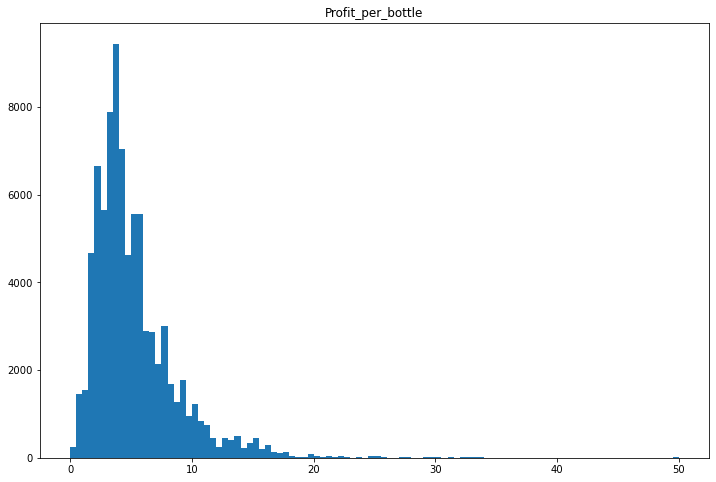

In [12]:
#seeing the distribution of profit per bottle
df.hist(column='Profit_per_bottle', bins=100, grid=False, figsize=(12,8),range=[0, 50])

In [13]:
df['category_name'].nunique()

125

In [14]:
#turning the store names to lowercase to prevent discrepancies
df['store_name'] = df['store_name'].str.lower()

df['category_name'] = df['category_name'].str.lower()

In [15]:
#defining a function to create a column of the different store types for hy-vee
def store(b):
    if ('quick' in b) or ('kwik' in b) or ('conven' in b) or ('fresh' in b) or ('c-store' in b):
        return 'Convenience'
    elif ('gas' in b) or ('petro' in b) or ('fuel' in b):
        return 'Gas'
    elif ('liquor' in b) or ('spirits' in b) or ('beverage' in b) or ('bottle' in b) or ('distil' in b) or ('wine' in b):
        return 'Liquor Store'
    elif ('drug' in b) or ('pharmacy' in b):
        return 'Drug Store'
    else:
        return 'Supermarket'

df['Store Type'] = df.store_name.apply(lambda y: store(y))

In [16]:
df['Store Type'].value_counts()

Supermarket     55809
Liquor Store    15939
Drug Store      12232
Convenience       437
Gas                45
Name: Store Type, dtype: int64

In [17]:
#making a function to classify the different liquor types into a column

def func(a):
    if "vodka" in a:
        return "vodka"
    elif "tequila" in a:
        return "tequila"
    elif "rum" in a:
        return "rum"
    elif "gin" in a:
        return "gin"
    elif "wine" in a:
        return "wine"
    elif "beer" in a:
        return "beer"
    elif "wine" in a:
        return "wine"
    elif "brand" in a:
        return "brandy"
    elif ('liqueur' in a) or ("triple" in a):
        return 'liqueurs'
    elif "schnap" in a:
        return "schnapps"
    elif ('grain spirits' in a):
        return 'moonshine'
    elif ('mezcal' in a):
        return 'mezcal'
    elif ('cocktail' in a):
        return 'cocktail mix'
    elif 'special' in a:
        return "gifts"
    elif "whisk" in a or "bourbon" in a or "scotch" in a:
        return "whisky"
    else:
        return "Other"

df["LiquorType"] = df.category_name.apply(lambda x: func(x))

In [18]:
df['LiquorType'].value_counts()

whisky          22804
vodka           20164
liqueurs        10501
rum              9338
schnapps         4831
tequila          4290
brandy           3619
gin              3541
cocktail mix     3142
gifts            1291
Other             548
moonshine         299
beer               49
mezcal             45
Name: LiquorType, dtype: int64

In [19]:
#turing the column to str so we can make this function
df.bottle_volume_ml = df.bottle_volume_ml.astype(str)

In [20]:
#making a function to convert bottle volume into categories
def bottle(c):
    if "750" in c:
        return "750"
    elif "1750" in c:
        return "1750"
    elif "375" in c:
        return "375"
    elif "50" in c:
        return "c"
    elif "1000" in c:
        return "1000"
    elif "200" in c:
        return "200"
    elif "100" in c:
        return "100"
    else:
        return "Other"

df['Bottle Size'] = df.bottle_volume_ml.apply(lambda y: bottle(y))

In [21]:
#dropping original column since its now repetitive
df = df.drop('bottle_volume_ml', 1)

In [22]:
df

,date,store_number,store_name,address,city,zip_code,store_location,county,category_name,vendor_number,vendor_name,item_description,pack,state_bottle_cost,state_bottle_retail,bottles_sold,sale_dollars,volume_sold_liters,Profit_per_bottle,Profit_per_sale,Store Type,LiquorType,Bottle Size
0,2016-12-08,2648,hy-vee #4 / wdm,555 S 51st St,West Des Moines,50265,POINT (-93.773557 41.561197),POLK,canadian whiskies,55.0,SAZERAC NORTH AMERICA,Canadian Ltd Whisky,6,9.14,13.710000,6,75.059998,10.50,4.570000,27.419998,Supermarket,whisky,750
1,2017-04-10,2575,hy-vee food store #1 / waterloo,2834 Ansborough Ave,Waterloo,50702.0,POINT (-92.37662400000002 42.471767),BLACK HAWK,cocktails /rtd,112,AMERICAN VINTAGE BEVERAGE,TGIFridays Ultimate Mudslide,6,7.52,11.280000,6,67.680000,10.50,3.760000,22.559998,Supermarket,cocktail mix,750
2,2018-04-26,2544,hy-vee food store / marshalltown,802 South Center,Marshalltown,50158.0,POINT (-92.912817 42.039205),MARSHALL,whiskey liqueur,421,SAZERAC COMPANY INC,Fireball Cinnamon Whiskey,12,11.34,17.010000,12,204.119995,12.00,5.670000,68.040001,Supermarket,liqueurs,1000
3,2015-11-09,2588,hy-vee food and drug #6 / cedar rapi,4035 MT. VERNON ROAD S.E.,CEDAR RAPIDS,52403,POINT (-91.60978 41.976835),Linn,whiskey liqueur,85.0,Brown-Forman Corporation,Southern Comfort Mini,12,4.71,7.070000,1,7.070000,0.50,2.360000,2.360000,Drug Store,liqueurs,c
4,2021-04-06,2651,hy-vee / waverly,1311 4 Street SW,Waverly,50677.0,POINT (-92.475403 42.712263),BREMER,american schnapps,65.0,Jim Beam Brands,Dekuyper Luscious Peachtree,12,6.50,9.750000,3,29.250000,2.25,3.250000,9.750000,Supermarket,schnapps,750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99994,2012-05-02,2611,hy-vee drugstore / ottumwa,1140 NORTH JEFFERSON ST,OTTUMWA,52501,POINT (-92.401538 41.026754000000004),Wapello,tequila,395,Proximo,Jose Cuervo Especial Reposado Flask,24,5.49,8.240000,3,24.719999,1.12,2.750000,8.250000,Drug Store,tequila,375
99995,2016-01-13,2594,hy-vee food store / sioux city,4500 SERGEANT ROAD,SIOUX CITY,51106,POINT (-96.346969 42.447396),Woodbury,straight rye whiskies,260,Diageo Americas,Bulleit 95 Rye,12,16.75,25.129999,12,301.559998,9.00,8.379999,100.559990,Supermarket,whisky,750
99996,2013-04-04,2508,hy-vee food store #1 / cedar rapids,"1843 JOHNSON AVENUE, N.W.",CEDAR RAPIDS,52405,POINT (-91.697941 41.97447),Linn,irish whiskies,370,Pernod Ricard USA/Austin Nichols,Jameson,24,6.74,10.110000,2,20.219999,0.75,3.370000,6.740000,Supermarket,whisky,375
99997,2017-09-06,2670,hy-vee food store / coralville,2004 8th St,Coralville,52241,POINT (-91.591868 41.682337000000004),JOHNSON,cocktails /rtd,370,PERNOD RICARD USA,Kahlua Frozen Mudslide,6,7.99,11.990000,6,71.940002,10.50,4.000000,24.000000,Supermarket,cocktail mix,750


# Looking at the type of store generating the most profits

In [23]:
total_sale_store = df.groupby('Store Type').agg({'Profit_per_sale':'sum'}).reset_index().sort_values('Profit_per_sale',ascending =False)
tts = total_sale_store.head(50)
tts

,Store Type,Profit_per_sale
4,Supermarket,2.908381e+06
3,Liquor Store,8.521401e+05
1,Drug Store,5.152171e+05
0,Convenience,1.660847e+04
2,Gas,8.918400e+02


Text(0.5, 0, 'Store Type')

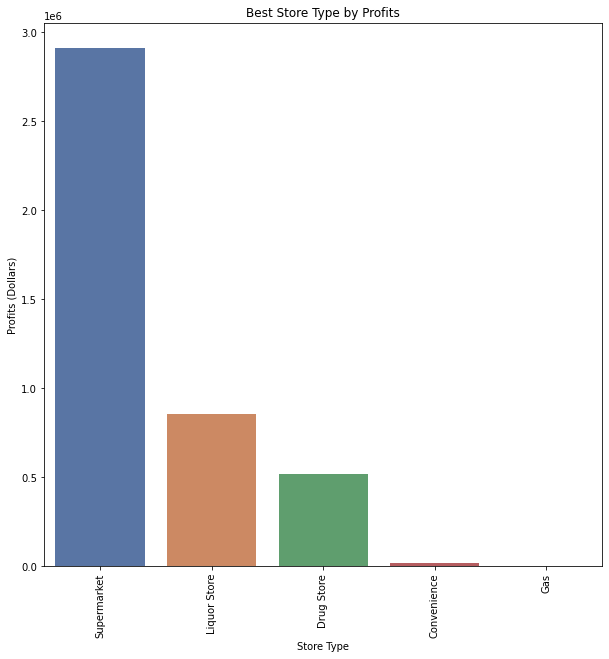

In [24]:
a1 = (10, 10)
fig, ax = plt.subplots(figsize=a1)
plot= sns.barplot(x="Store Type", y="Profit_per_sale", data=tts,palette ="deep")
plot.set_xticklabels(ax.get_xticklabels(),rotation=90)
plot.set_title('Best Store Type by Profits')
ax.set_ylabel('Profits (Dollars)')
ax.set_xlabel('Store Type')

# Which liquor type are most profitable overall 

In [25]:
total_sale_liquor = df.groupby('LiquorType').agg({'Profit_per_sale':'sum'}).reset_index().sort_values('Profit_per_sale',ascending =False)
ttb = total_sale_liquor.head(10)
ttb

,LiquorType,Profit_per_sale
13,whisky,1.368021e+06
12,vodka,1.031822e+06
6,liqueurs,5.283650e+05
9,rum,4.836003e+05
11,tequila,2.787987e+05
10,schnapps,1.482963e+05
5,gin,1.255133e+05
4,gifts,1.055067e+05
2,brandy,9.992421e+04
3,cocktail mix,9.284782e+04


Text(0.5, 0, 'Liquor Type')

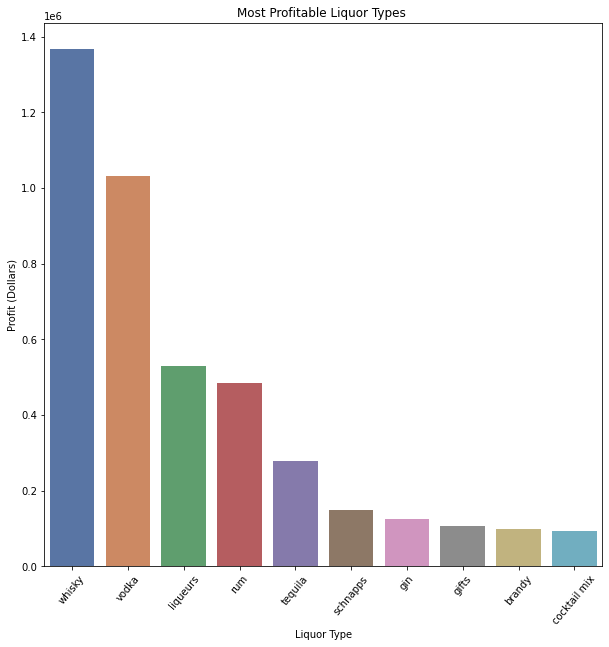

In [26]:

fig, ax = plt.subplots(figsize=(10,10))
plot= sns.barplot(x="LiquorType", y="Profit_per_sale", data=ttb,palette ="deep")
plot.set_xticklabels(ax.get_xticklabels(),rotation=50)
plot.set_title('Most Profitable Liquor Types ')
ax.set_ylabel('Profit (Dollars)')
ax.set_xlabel('Liquor Type')

# Exploring which categories of alcohol are more profitable on average

In [27]:
best10 = df.groupby(['category_name'])['Profit_per_bottle'].mean().groupby(['category_name']).max().sort_values().groupby(['category_name']).sum().sort_values(ascending=False).reset_index()

best10_plot = px.bar(best10.head(10),x=best10['category_name'].head(10), y='Profit_per_bottle',color='Profit_per_bottle')
best10_plot.update_layout(
    title="10 Best Average Profit per Bottle Liquor Categories",
    xaxis_title="Category Name",
    yaxis_title="Average Profit per Bottle($)")
best10_plot.show()

# Exploring which categories of alcohol are least profitable

In [28]:
low10_plot = px.bar(best10.tail(10),x=best10['category_name'].tail(10), y='Profit_per_bottle',color='Profit_per_bottle')
low10_plot.update_layout(
    title="10 Lowest Profit Liquor Categories",
    xaxis_title="Category Name",
    yaxis_title="Average Profit per Bottle($)")
low10_plot.show()

# Exploring which counties have the highest profits overall 

In [29]:
#turning the county names to lowercase to prevent discrepancies
df['county'] = df['county'].str.lower()

In [30]:
bestcounty = df.groupby(['county'])['Profit_per_sale'].sum().groupby(['county']).max().sort_values().groupby(['county']).sum().sort_values(ascending=False).reset_index()

bestcounty_plot = px.bar(bestcounty.head(10),x=bestcounty['county'].head(10), y='Profit_per_sale',color='Profit_per_sale')
bestcounty_plot.update_layout(
    title="10 Best County Profit Liquor",
    xaxis_title="county",
    yaxis_title="Total Profits ($)")
bestcounty_plot.show()

# Comparing sales profits by city

In [31]:
df['city'] = df['city'].str.lower()

In [32]:
bestcity = df.groupby(['city'])['Profit_per_sale'].sum().groupby(['city']).max().sort_values().groupby(['city']).sum().sort_values(ascending=False).reset_index()

bestcity_plot = px.bar(bestcity.head(10),x=bestcity['city'].head(10), y='Profit_per_sale',color='Profit_per_sale')
bestcity_plot.update_layout(
    title="10 Best City for Profit Liquor Categories",
    xaxis_title="City",
    yaxis_title="Total Profits ($)")
bestcity_plot.show()

# Finding Total Bottles Sold in each City

In [33]:
bottlecity = df.groupby(['city'])['bottles_sold'].sum().groupby(['city']).max().sort_values().groupby(['city']).sum().sort_values(ascending=False).reset_index()

bottlecity_plot = px.bar(bottlecity.head(10),x=bottlecity['city'].head(10), y='bottles_sold',color='bottles_sold')
bottlecity_plot.update_layout(
    title="10 Highest Bottles Sold by City",
    xaxis_title="City",
    yaxis_title="Total Bottles Sold")
bottlecity_plot.show()

# Comparing Vendors with the Highest Profits

In [34]:
df['vendor_name'] = df['vendor_name'].str.lower()

In [35]:
bestvendors = df.groupby(['vendor_name'])['Profit_per_sale'].sum().groupby(['vendor_name']).max().sort_values().groupby(['vendor_name']).sum().sort_values(ascending=False).reset_index()

bestvendors_plot = px.bar(bestvendors.head(10),x=bestvendors['vendor_name'].head(10), y='Profit_per_sale',color='Profit_per_sale')
bestvendors_plot.update_layout(
    title="10 Best Vendors for Profit Liquor Categories",
    xaxis_title="Vendor",
    yaxis_title="Total Profits ($)")
bestvendors_plot.show()

In [36]:

#df['city'].value_counts().head(20)
df.groupby(['city'])['store_name'].value_counts()

city             store_name                               
albia            hy-vee food store / albia                     133
algona           hy-vee wine and spirits / algona              628
altoona          hy-vee food store / altoona                  1042
ames             hy-vee  #2 / ames                             548
                 hy-vee drugstore #2 / ames                    118
                 hy-vee wine and spirits / ames                 36
                 hy-vee gas #5018 / ames                         1
ankeny           hy-vee food store #2 / state ankeny           625
                 hy-vee #2 / ankeny                            547
                 hy-vee #2                                      12
                 hy-vee gas #1 / ankeny                          8
                 hy-vee c-store #2 - ankeny                      1
                 hy-vee wine and spirits / ankeny                1
atlantic         hy-vee wine and spirits / atlantic            574
   

In [37]:
#finding the most commonly purchased category
df['category_name'].mode()

0    canadian whiskies
dtype: object

In [38]:
#finding the most common vendor in the dataset
df['vendor_name'].mode()

0    diageo americas
dtype: object

# Looking at the sales for each store location

In [39]:
store_sales= df.groupby('store_name').sale_dollars.sum().groupby(['store_name']).max().sort_values().groupby(['store_name']).sum().sort_values(ascending=False).reset_index()
store_sales_plot = px.bar(store_sales.head(10),x=store_sales['store_name'].head(10), y='sale_dollars',color='sale_dollars')
store_sales_plot.update_layout(
    title="10 Highest Sales Stores",
    xaxis_title="Store Number",
    yaxis_title="Total Sales($)")
store_sales_plot.show()

# Checking if the stores with the highest sales also have the highest profits

In [40]:
store_profit= df.groupby('store_name').Profit_per_sale.sum().groupby(['store_name']).max().sort_values().groupby(['store_name']).sum().sort_values(ascending=False).reset_index()
store_profit_plot = px.bar(store_profit.head(10),x=store_profit['store_name'].head(10), y='Profit_per_sale',color='Profit_per_sale')
store_profit_plot.update_layout(
    title="10 Highest Profit Stores",
    xaxis_title="Store Name",
    yaxis_title="Total Profits($)")
store_profit_plot.show()

# Looking at monthly profits for liquor types

# Creating a Heatmap of the locations of the liquor stores in Iowa

In [41]:
#Changing the column type to string so we can strip leading POINT
df['store_location'] = df.store_location.astype(str)

#stripping the non-latitude-longitude values from the column
df['store_location'] = df['store_location'].map(lambda x: x.lstrip('POINT (').rstrip(')'))

#creating latitude and longitude columns to use for our heatmap
df[['Longitude','Latitude']] = df['store_location'].str.split(' ', expand=True)


In [42]:
#folium requires the data to be float type

df['Latitude'] = df['Latitude'].str.replace(' ', '').astype(float)
df['Longitude'] = df['Longitude'].str.replace(' ', '').astype(float)

#dropping the original store location column since now it is repetitive
df = df.drop('store_location', 1)

In [43]:
df.head()

,date,store_number,store_name,address,city,zip_code,county,category_name,vendor_number,vendor_name,item_description,pack,state_bottle_cost,state_bottle_retail,bottles_sold,sale_dollars,volume_sold_liters,Profit_per_bottle,Profit_per_sale,Store Type,LiquorType,Bottle Size,Longitude,Latitude
0,2016-12-08,2648,hy-vee #4 / wdm,555 S 51st St,west des moines,50265,polk,canadian whiskies,55.0,sazerac north america,Canadian Ltd Whisky,6,9.14,13.71,6,75.059998,10.50,4.57,27.419998,Supermarket,whisky,750,-93.773557,41.561197
1,2017-04-10,2575,hy-vee food store #1 / waterloo,2834 Ansborough Ave,waterloo,50702.0,black hawk,cocktails /rtd,112,american vintage beverage,TGIFridays Ultimate Mudslide,6,7.52,11.28,6,67.680000,10.50,3.76,22.559998,Supermarket,cocktail mix,750,-92.376624,42.471767
2,2018-04-26,2544,hy-vee food store / marshalltown,802 South Center,marshalltown,50158.0,marshall,whiskey liqueur,421,sazerac company inc,Fireball Cinnamon Whiskey,12,11.34,17.01,12,204.119995,12.00,5.67,68.040001,Supermarket,liqueurs,1000,-92.912817,42.039205
3,2015-11-09,2588,hy-vee food and drug #6 / cedar rapi,4035 MT. VERNON ROAD S.E.,cedar rapids,52403,linn,whiskey liqueur,85.0,brown-forman corporation,Southern Comfort Mini,12,4.71,7.07,1,7.070000,0.50,2.36,2.360000,Drug Store,liqueurs,c,-91.609780,41.976835
4,2021-04-06,2651,hy-vee / waverly,1311 4 Street SW,waverly,50677.0,bremer,american schnapps,65.0,jim beam brands,Dekuyper Luscious Peachtree,12,6.50,9.75,3,29.250000,2.25,3.25,9.750000,Supermarket,schnapps,750,-92.475403,42.712263


In [44]:
import folium
from IPython.display import display

mymap= folium.Map(location=[43.088341,-93.990256], zoom_start=8, )

hm_wide = HeatMap(
    list(zip(df.Latitude.values, df.Longitude.values)),
    min_opacity=0.3,
    radius=10, 
    blur=9, 
    max_zoom=1,
)
mymap.add_child(hm_wide)
#mymap.add_child(folium.ClickForMarker(popup='Potential Location'))

In [45]:
df

,date,store_number,store_name,address,city,zip_code,county,category_name,vendor_number,vendor_name,item_description,pack,state_bottle_cost,state_bottle_retail,bottles_sold,sale_dollars,volume_sold_liters,Profit_per_bottle,Profit_per_sale,Store Type,LiquorType,Bottle Size,Longitude,Latitude
0,2016-12-08,2648,hy-vee #4 / wdm,555 S 51st St,west des moines,50265,polk,canadian whiskies,55.0,sazerac north america,Canadian Ltd Whisky,6,9.14,13.710000,6,75.059998,10.50,4.570000,27.419998,Supermarket,whisky,750,-93.773557,41.561197
1,2017-04-10,2575,hy-vee food store #1 / waterloo,2834 Ansborough Ave,waterloo,50702.0,black hawk,cocktails /rtd,112,american vintage beverage,TGIFridays Ultimate Mudslide,6,7.52,11.280000,6,67.680000,10.50,3.760000,22.559998,Supermarket,cocktail mix,750,-92.376624,42.471767
2,2018-04-26,2544,hy-vee food store / marshalltown,802 South Center,marshalltown,50158.0,marshall,whiskey liqueur,421,sazerac company inc,Fireball Cinnamon Whiskey,12,11.34,17.010000,12,204.119995,12.00,5.670000,68.040001,Supermarket,liqueurs,1000,-92.912817,42.039205
3,2015-11-09,2588,hy-vee food and drug #6 / cedar rapi,4035 MT. VERNON ROAD S.E.,cedar rapids,52403,linn,whiskey liqueur,85.0,brown-forman corporation,Southern Comfort Mini,12,4.71,7.070000,1,7.070000,0.50,2.360000,2.360000,Drug Store,liqueurs,c,-91.609780,41.976835
4,2021-04-06,2651,hy-vee / waverly,1311 4 Street SW,waverly,50677.0,bremer,american schnapps,65.0,jim beam brands,Dekuyper Luscious Peachtree,12,6.50,9.750000,3,29.250000,2.25,3.250000,9.750000,Supermarket,schnapps,750,-92.475403,42.712263
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99994,2012-05-02,2611,hy-vee drugstore / ottumwa,1140 NORTH JEFFERSON ST,ottumwa,52501,wapello,tequila,395,proximo,Jose Cuervo Especial Reposado Flask,24,5.49,8.240000,3,24.719999,1.12,2.750000,8.250000,Drug Store,tequila,375,-92.401538,41.026754
99995,2016-01-13,2594,hy-vee food store / sioux city,4500 SERGEANT ROAD,sioux city,51106,woodbury,straight rye whiskies,260,diageo americas,Bulleit 95 Rye,12,16.75,25.129999,12,301.559998,9.00,8.379999,100.559990,Supermarket,whisky,750,-96.346969,42.447396
99996,2013-04-04,2508,hy-vee food store #1 / cedar rapids,"1843 JOHNSON AVENUE, N.W.",cedar rapids,52405,linn,irish whiskies,370,pernod ricard usa/austin nichols,Jameson,24,6.74,10.110000,2,20.219999,0.75,3.370000,6.740000,Supermarket,whisky,375,-91.697941,41.974470
99997,2017-09-06,2670,hy-vee food store / coralville,2004 8th St,coralville,52241,johnson,cocktails /rtd,370,pernod ricard usa,Kahlua Frozen Mudslide,6,7.99,11.990000,6,71.940002,10.50,4.000000,24.000000,Supermarket,cocktail mix,750,-91.591868,41.682337


# Getting Location data for ALL stores in Iowa in 2021
So we can compare where all liquor selling stores are in relation to cities, etc.

In [46]:
#Set environment variables for your notebook
import pyarrow 
import os 
os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = '/Users/amandamanfredo/Downloads/liquor_data.json'
#Imports google cloud client library and initiates BQ service
from google.cloud import bigquery
bigquery_client = bigquery.Client()
#Write Query on BQ
QUERY = """
SELECT date,store_name,address,city,zip_code,store_location,
county,category_name,vendor_number,vendor_name,item_description,state_bottle_cost,state_bottle_retail,bottles_sold,
sale_dollars,volume_sold_liters
FROM `bigquery-public-data.iowa_liquor_sales.sales` 
WHERE  (date>='2021-01-01' AND date<'2021-12-31')
ORDER BY rand()
LIMIT 100000
  """
#Run the query and write result to a pandas data frame
Query_Results = bigquery_client.query(QUERY)
allstores = Query_Results.to_dataframe()
#View top few rows of result
allstores.head()

,date,store_name,address,city,zip_code,store_location,county,category_name,vendor_number,vendor_name,item_description,state_bottle_cost,state_bottle_retail,bottles_sold,sale_dollars,volume_sold_liters
0,2021-01-20,Hy-Vee Food and Drug / Grand / WDM,1990 Grand Avenue,West Des Moines,50265.0,POINT (-93.73162 41.571127),POLK,Tennessee Whiskies,85.0,Brown Forman Corp.,Gentleman Jack,20.01,30.02,1,30.02,0.75
1,2021-10-12,Kum & Go #52 / Iowa City,25 W Burlington St,Iowa City,52240.0,POINT (-91.537252 41.657904),JOHNSON,Imported Cordials & Liqueurs,192,"Mast-Jagermeister US, Inc",Jagermeister Liqueur,13.00,19.50,5,97.50,3.75
2,2021-02-03,Hy-Vee Wine and Spirits / Iowa City,1720 Waterfront Dr,Iowa City,52240.0,POINT (-91.53046300000001 41.642764),JOHNSON,Mixto Tequila,434.0,LUXCO INC,Juarez Gold,15.00,22.50,6,135.00,10.50
3,2021-06-10,Five Corners Liquor & Wine,809 E 18th St,Cedar Falls,50613.0,POINT (-92.436845 42.5214),BLACK HAWK,Imported Schnapps,421,SAZERAC COMPANY INC,Dr McGillicuddys Wild Grape,8.66,12.99,1,12.99,0.75
4,2021-07-21,Cork and Bottle / Oskaloosa,309 A Ave West,Oskaloosa,52577.0,POINT (-92.648153 41.296228),MAHASKA,Canadian Whiskies,260,DIAGEO AMERICAS,Crown Royal,8.00,12.00,4,48.00,1.50


In [47]:
#Changing the column type to string so we can strip leading POINT
allstores['store_location'] = allstores.store_location.astype(str)

#stripping the non-latitude-longitude values from the column
allstores['store_location'] = allstores['store_location'].map(lambda x: x.lstrip('POINT (').rstrip(')'))

#creating latitude and longitude columns to use for our heatmap
allstores[['Longitude','Latitude']] = allstores['store_location'].str.split(' ', expand=True)


In [48]:
#folium requires the data to be float type

allstores['Latitude'] = allstores['Latitude'].str.replace(' ', '').astype(float)
allstores['Longitude'] = allstores['Longitude'].str.replace(' ', '').astype(float)

#dropping the original store location column since now it is repetitive
#allstores= allstores.drop('store_location', 1)

ValueError: could not convert string to float: 'one'

# Looking at time series data 

In [49]:
from dateutil.parser import parse 

In [50]:
#making a new dataframe I can make changes to
timedf=df
#converting date column to datetime
timedf['date'] = pd.to_datetime(timedf['date'])
timedf['day_name'] = timedf['date'].dt.day_name()

In [51]:
timedf.head()

,date,store_number,store_name,address,city,zip_code,county,category_name,vendor_number,vendor_name,item_description,pack,state_bottle_cost,state_bottle_retail,bottles_sold,sale_dollars,volume_sold_liters,Profit_per_bottle,Profit_per_sale,Store Type,LiquorType,Bottle Size,Longitude,Latitude,day_name
0,2016-12-08,2648,hy-vee #4 / wdm,555 S 51st St,west des moines,50265,polk,canadian whiskies,55.0,sazerac north america,Canadian Ltd Whisky,6,9.14,13.71,6,75.059998,10.50,4.57,27.419998,Supermarket,whisky,750,-93.773557,41.561197,Thursday
1,2017-04-10,2575,hy-vee food store #1 / waterloo,2834 Ansborough Ave,waterloo,50702.0,black hawk,cocktails /rtd,112,american vintage beverage,TGIFridays Ultimate Mudslide,6,7.52,11.28,6,67.680000,10.50,3.76,22.559998,Supermarket,cocktail mix,750,-92.376624,42.471767,Monday
2,2018-04-26,2544,hy-vee food store / marshalltown,802 South Center,marshalltown,50158.0,marshall,whiskey liqueur,421,sazerac company inc,Fireball Cinnamon Whiskey,12,11.34,17.01,12,204.119995,12.00,5.67,68.040001,Supermarket,liqueurs,1000,-92.912817,42.039205,Thursday
3,2015-11-09,2588,hy-vee food and drug #6 / cedar rapi,4035 MT. VERNON ROAD S.E.,cedar rapids,52403,linn,whiskey liqueur,85.0,brown-forman corporation,Southern Comfort Mini,12,4.71,7.07,1,7.070000,0.50,2.36,2.360000,Drug Store,liqueurs,c,-91.609780,41.976835,Monday
4,2021-04-06,2651,hy-vee / waverly,1311 4 Street SW,waverly,50677.0,bremer,american schnapps,65.0,jim beam brands,Dekuyper Luscious Peachtree,12,6.50,9.75,3,29.250000,2.25,3.25,9.750000,Supermarket,schnapps,750,-92.475403,42.712263,Tuesday


In [52]:
#finding the total sales profits each day
#dailyprofits = timedf.groupby([timedf.date.dt.dayofyear])['Profit_per_sale'].sum().reset_index()
dailyprofits = timedf.groupby(['date'])['Profit_per_sale'].sum().reset_index()

#rename sum of profit per sale to profit per day
dailyprofits.rename({'Profit_per_sale': 'Profit_per_day'}, axis=1, inplace=True)
dailyprofits.head()

,date,Profit_per_day
0,2012-01-03,1045.780029
1,2012-01-04,1149.800049
2,2012-01-05,1350.099976
3,2012-01-09,1186.570068
4,2012-01-10,944.659973


In [53]:
#finding which day had the highest profit sales
print("Max profits:", dailyprofits.loc[dailyprofits['Profit_per_day'] == dailyprofits['Profit_per_day'].max()])

#finding the day with the lowest profit sales
print("Min profits:",dailyprofits.loc[dailyprofits['Profit_per_day'] == dailyprofits['Profit_per_day'].min()])

Max profits:            date  Profit_per_day
2309 2021-10-05    34995.707031
Min profits:           date  Profit_per_day
765 2015-08-07            10.0


Text(0.5, 1.0, 'Profit per Day')

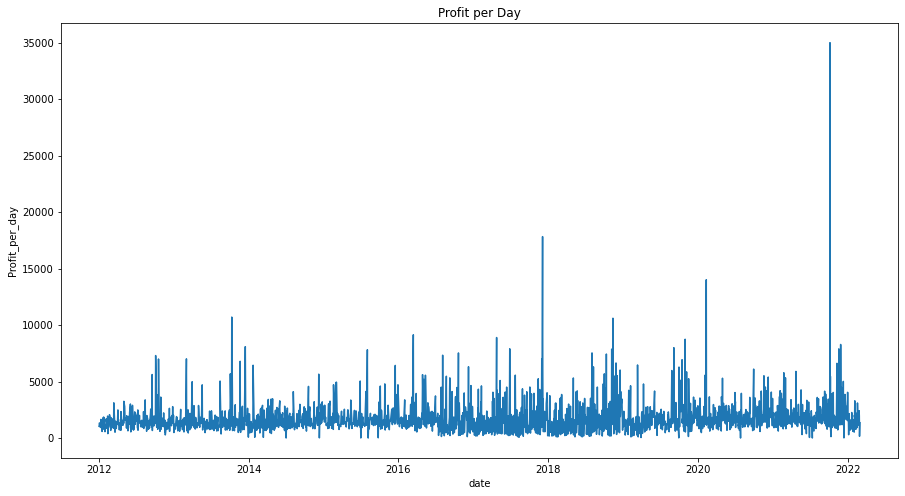

In [54]:
y=dailyprofits['Profit_per_day']
x=dailyprofits['date']
plt.figure(figsize=(15,8))
sns.lineplot(x,y)
plt.title('Profit per Day')

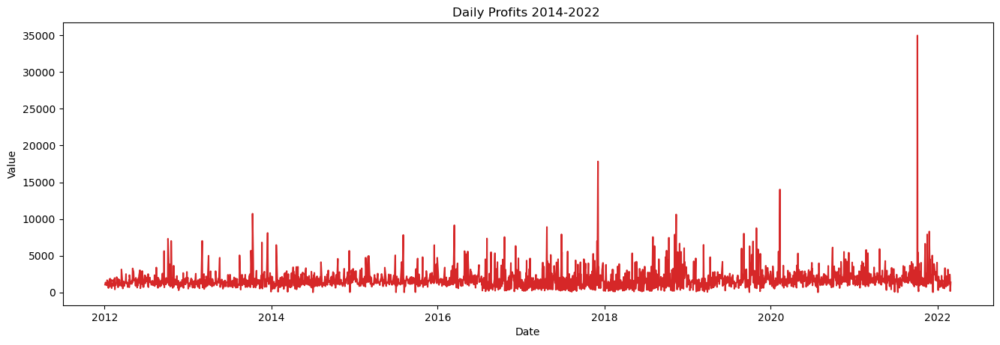

In [55]:
def plot_df(df, x, y, title="", xlabel='Date', ylabel='Value', dpi=100):
    plt.figure(figsize=(16,5), dpi=dpi)
    plt.plot(x, y, color='tab:red')
    plt.gca().set(title=title, xlabel=xlabel, ylabel=ylabel)
    plt.show()

plot_df(dailyprofits, x=dailyprofits.date, y=dailyprofits.Profit_per_day, title='Daily Profits 2014-2022 ')    

# Looking at bottles sold per day

In [56]:

#creating a dataframe of the total bottles sold per day
dailybottles=timedf.groupby(['date'])['bottles_sold'].sum().reset_index()

#dailysales = dailysales.set_index('date')

#rename sum of profit per sale to profit per day
dailybottles.rename({'bottles_sold': 'daily_bottles_sold'}, axis=1, inplace=True)

#converting the date to datetime format
#dailybottles['date']=pd.to_datetime(dailybottles['date'])
dailybottles.head()

,date,daily_bottles_sold
0,2012-01-03,249
1,2012-01-04,245
2,2012-01-05,340
3,2012-01-09,295
4,2012-01-10,222


Text(0.5, 1.0, 'Bottles Sold Per Day')

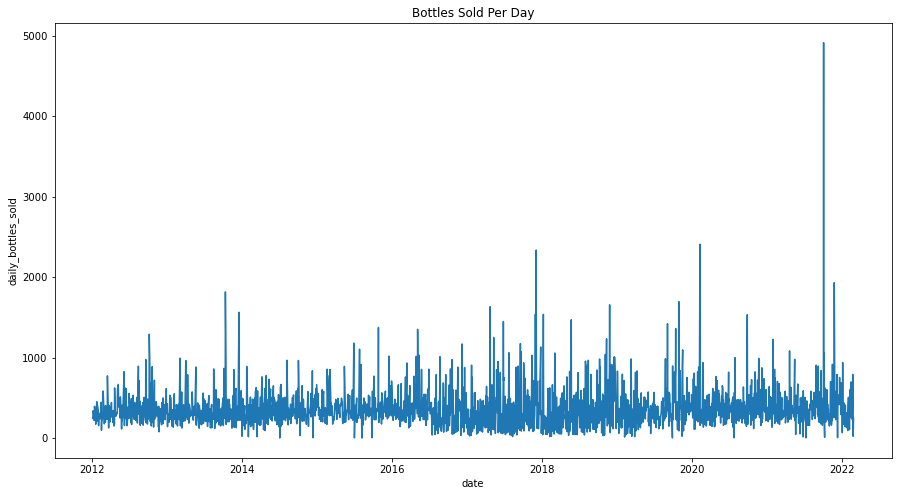

In [57]:
#plotting the bottles sold per day
y=dailybottles['daily_bottles_sold']
x=dailybottles['date']
plt.figure(figsize=(15,8))
sns.lineplot(x,y)
plt.title('Bottles Sold Per Day')

Text(0.5, 1.0, 'Daily Bottles Sold')

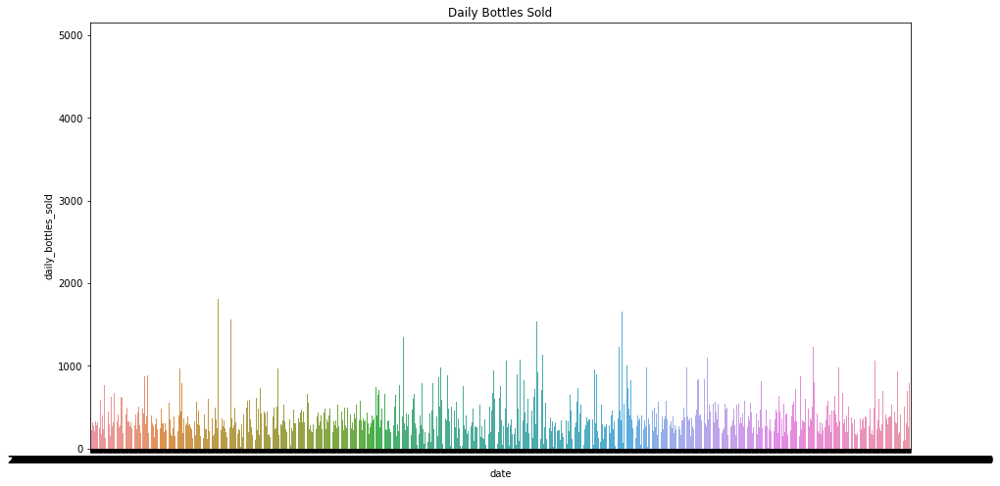

In [58]:
plt.figure(figsize=(15,8))
sns.barplot(x,y)
plt.title('Daily Bottles Sold')

# Comparing weekly sales

In [59]:
#making a new df to experiment with without ruining original
df2=df

#converting date column to datetime
df2['date'] = pd.to_datetime(df2['date'])

Text(0.5, 1.0, 'Bottles Sold Each Week')

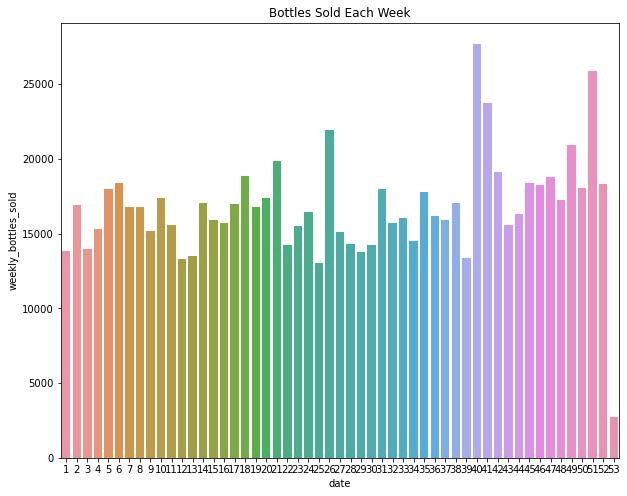

In [60]:
#finding the amount of bottles of liquor sold each week
weekly = df2.groupby(df2.date.dt.weekofyear)['bottles_sold'].agg('sum').reset_index()

#rename sum of bottles sold to weekly bottles sold
weekly.rename({'bottles_sold': 'weekly_bottles_sold'}, axis=1, inplace=True)

#plotting 
x1=weekly['date']
y1=weekly['weekly_bottles_sold']
plt.figure(figsize=(10,8))
sns.barplot(x1,y1)
plt.title('Bottles Sold Each Week')

<AxesSubplot:xlabel='date', ylabel='weekly_bottles_sold'>

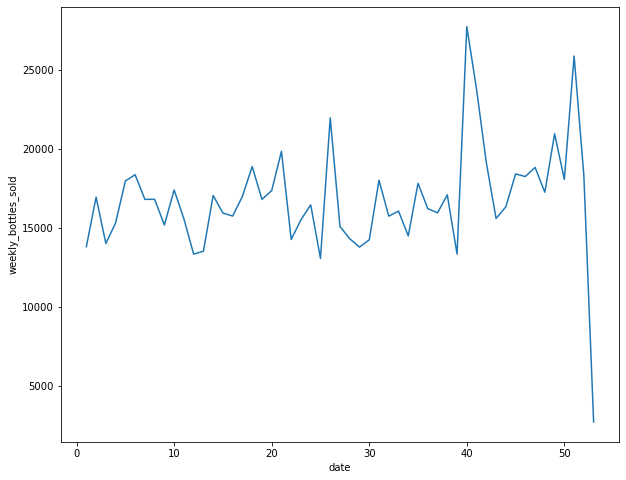

In [61]:
#lineplot of the weekly bottle sales
plt.figure(figsize=(10,8))
sns.lineplot(x1,y1)

Text(0.5, 1.0, 'Weekly Profit Each Week')

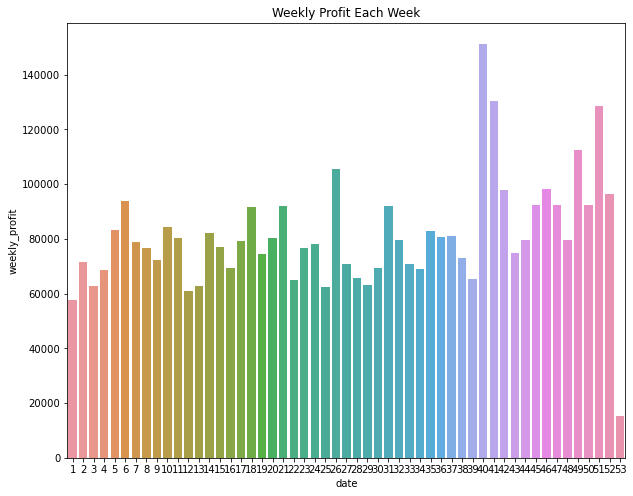

In [62]:
#finding the profit each week
weekly = df2.groupby(df2.date.dt.weekofyear)['Profit_per_sale'].agg('sum').reset_index()


#rename sum of bottles sold to weekly bottles sold
weekly.rename({'Profit_per_sale': 'weekly_profit'}, axis=1, inplace=True)

#plotting the profits by week
xw=weekly['date']
yw=weekly['weekly_profit']
plt.figure(figsize=(10,8))
sns.barplot(xw,yw)
plt.title('Weekly Profit Each Week')

<AxesSubplot:xlabel='date', ylabel='weekly_profit'>

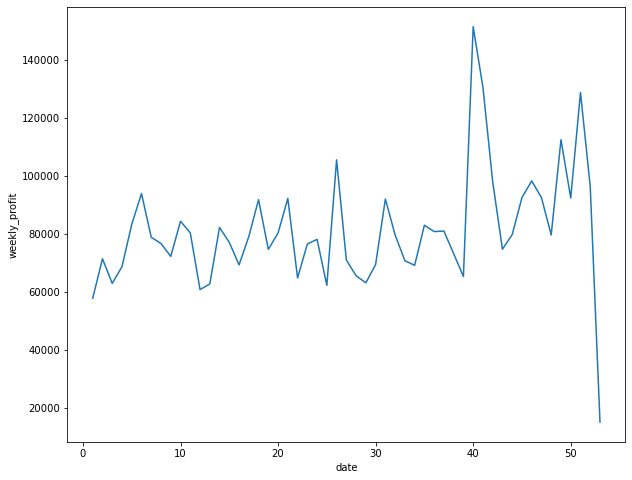

In [63]:
plt.figure(figsize=(10,8))
sns.lineplot(xw,yw)

<AxesSubplot:xlabel='date'>

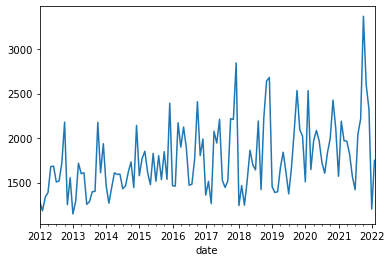

In [64]:
y = df.groupby('date')['Profit_per_sale'].sum().resample('MS').mean()
y.plot()

# Looking at months overall for seasonal patterns

Text(0.5, 1.0, 'Bottles Sold Each Month')

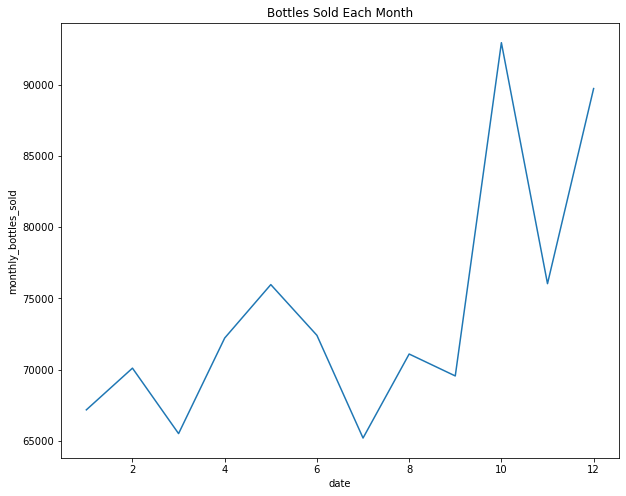

In [65]:
#finding the amount of bottles of liquor sold each month
monthly = df2.groupby(df2.date.dt.month)['bottles_sold'].agg('sum').reset_index()

#rename sum of bottles sold to monthly bottles sold
monthly.rename({'bottles_sold': 'monthly_bottles_sold'}, axis=1, inplace=True)

#plotting 
x1=monthly['date']
y1=monthly['monthly_bottles_sold']
plt.figure(figsize=(10,8))
sns.lineplot(x1,y1)
plt.title('Bottles Sold Each Month')

# Looking at months by year for overall trends

In [66]:
timedf['year_month'] = timedf['date'].dt.strftime('%Y-%m')

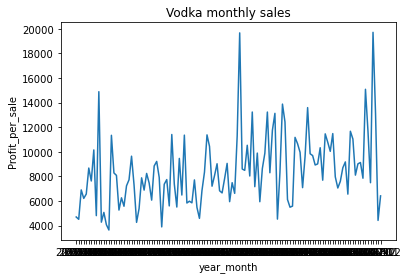

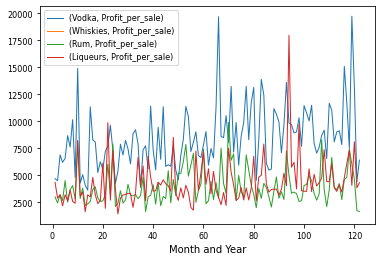

In [67]:
vodka = timedf[timedf['LiquorType'] == 'vodka'].groupby('year_month', as_index=False)['Profit_per_sale'].sum()
#print(vodka)

vodx=vodka['year_month']
vody=vodka['Profit_per_sale']

sns.lineplot(vodx,vody,data=vodka)
#plt.axhline(vodka['Profit_per_sale'].mean(),color="k",linestyle="dotted",linewidth=2)

plt.title('Vodka monthly sales') 

whisk = timedf[timedf['LiquorType'] == 'whisky/bourbon/scotch'].groupby('year_month', as_index=False)['Profit_per_sale'].sum()
whisky=whisk['Profit_per_sale']

rum = timedf[timedf['LiquorType'] == 'rum'].groupby('year_month', as_index=False)['Profit_per_sale'].sum()
rumy=rum['Profit_per_sale']

liqueurs = timedf[timedf['LiquorType'] == 'liqueurs'].groupby('year_month', as_index=False)['Profit_per_sale'].sum()
rumy=rum['Profit_per_sale']

top4=[vody, whisky, rumy, liqueurs]
headers = ["Vodka","Whiskies","Rum", "Liqueurs"]

top4_sell = pd.concat(top4, axis=1, keys=headers)
top4_sell.index = top4_sell.index +1

import matplotlib.ticker as ticker

ax = top4_sell.plot(linewidth=1,fontsize=8);
ax.set_xlabel('Month and Year');
ax.legend(fontsize=8)
ax.xaxis.set_major_locator(ticker.MultipleLocator(20));

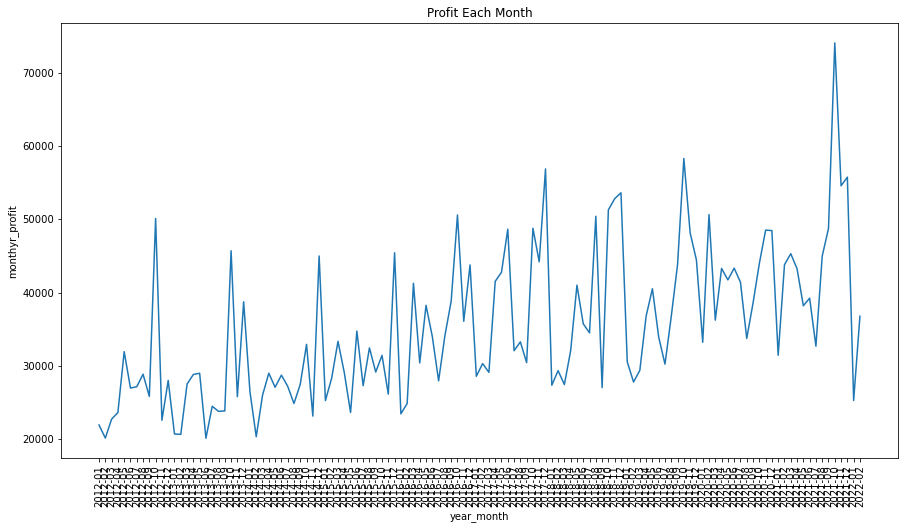

In [68]:
#finding the amount of profit of liquor sold each month
monthyr = timedf.groupby(timedf['year_month'])['Profit_per_sale'].agg('sum').reset_index()

#rename sum of profit sold to monthly bottles sold
monthyr.rename({'Profit_per_sale': 'monthyr_profit'}, axis=1, inplace=True)

#plotting 
xm=monthyr['year_month']
ym=monthyr['monthyr_profit']
plt.figure(figsize=(15,8))
sns.lineplot(xm,ym)
plt.title('Profit Each Month')
plt.xticks(rotation=90);
#plt.autofmt_xdate()

In [69]:
#monthyr.set_index('year_month', inplace=True)
monthyr['year_month']=pd.to_datetime(monthyr['year_month'])

In [70]:
monthyr.set_index('year_month', inplace=True)

<AxesSubplot:xlabel='year_month'>

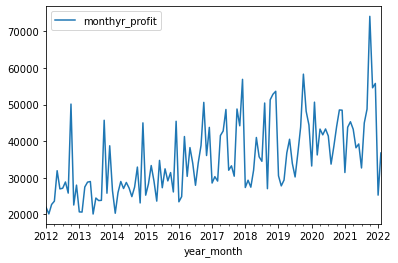

In [72]:
monthyr.plot()

In [73]:
from statsmodels.tsa.stattools import adfuller, kpss

In [74]:
#can make a function to find adf value
def adftest(series):
    results=adfuller(series)
    print(f'ADF Statistic: {results[0]}')
    print(f'p-value: {results[1]}')
    if results[1] <= 0.05:
        print('strong evidence againstnull hypothesis. Data is stationary')
    else:
        print('weak evidence against null hypothesis. Data is NON stationary')
        
adftest(monthyr['monthyr_profit'])

ADF Statistic: -0.11705157218253151
p-value: 0.9477134224251862
weak evidence against null hypothesis. Data is NON stationary


Text(0.5, 1.0, 'Liquor Sales detrended by subtracting the least squares fit')

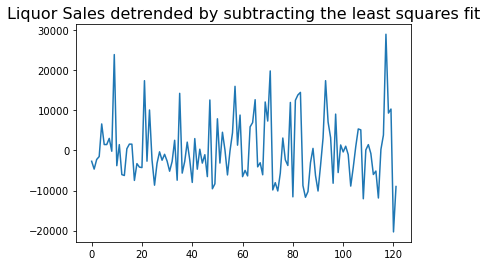

In [76]:
#Detrending a time series is to remove the trend component from a time series

# Using scipy: Subtract the line of best fit
from scipy import signal
detrended = signal.detrend(monthyr.monthyr_profit.values)
plt.plot(detrended)
plt.title('Liquor Sales detrended by subtracting the least squares fit', fontsize=16)


<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

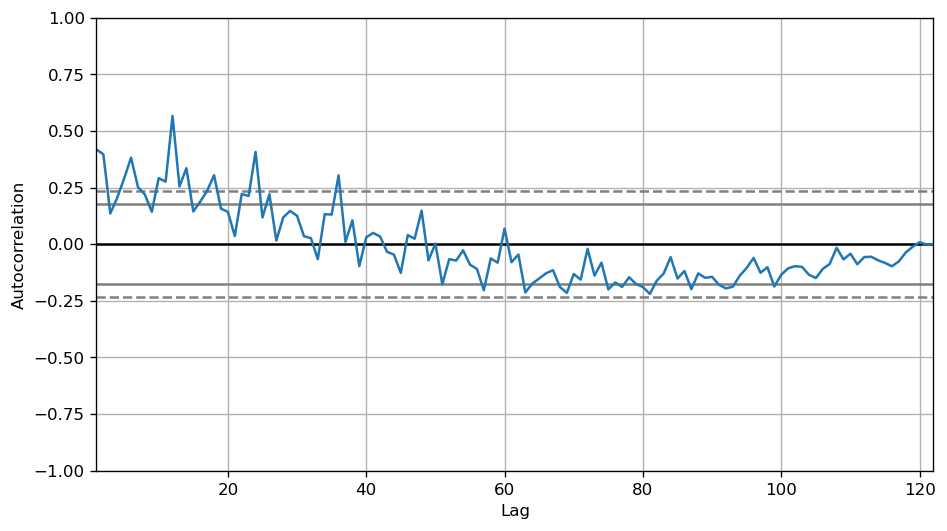

In [77]:
# when there is a strong seasonal pattern, the ACF plot usually reveals 
# definitive repeated spikes at the multiples of the seasonal window. 

from pandas.plotting import autocorrelation_plot
plt.rcParams.update({'figure.figsize':(9,5), 'figure.dpi':120})
autocorrelation_plot(monthyr.monthyr_profit.tolist())

# #Differencing the Timeseries data

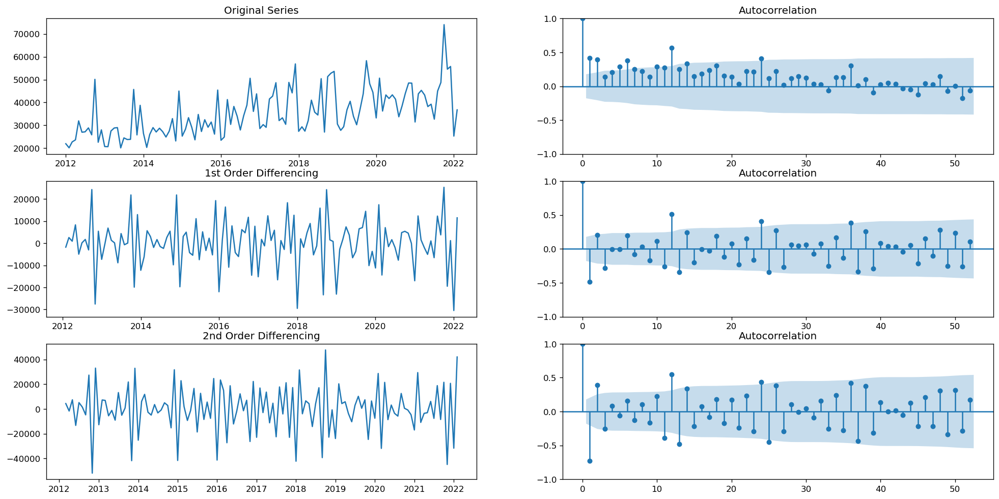

In [80]:
#Viewing the data in each state of differencing with its autocorrelation plot
# If a series is significantly autocorrelated, that means, the previous values of the series (lags) 
# may be helpful in predicting the current value. Partial Autocorrelation also conveys similar 
# information but it conveys the pure correlation of a series and its lag, excluding the correlation 
# contributions from the intermediate lags.


from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


# Original Series
fig, axes = plt.subplots(3, 2, figsize=(20,10))
axes[0, 0].plot(monthyr.monthyr_profit); axes[0, 0].set_title('Original Series')
plot_acf(monthyr.monthyr_profit, ax=axes[0, 1], lags=52)

# 1st Differencing
axes[1, 0].plot(monthyr.monthyr_profit.diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(monthyr.monthyr_profit.diff().dropna(), ax=axes[1, 1], lags=52)

# 2nd Differencing
axes[2, 0].plot(monthyr.monthyr_profit.diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(monthyr.monthyr_profit.diff().diff().dropna(), ax=axes[2, 1], lags=52)


plt.show()

In [79]:
#Testing if data is stationary after first difference= it is
adftest(monthyr.monthyr_profit.diff().dropna())

ADF Statistic: -6.409830717331183
p-value: 1.9029388412582124e-08
strong evidence againstnull hypothesis. Data is stationary


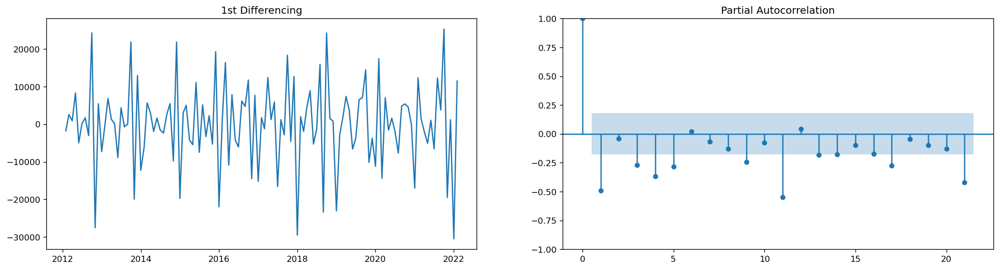

In [81]:
# PACF plot of 1st differenced series
fig, axes = plt.subplots(1, 2, figsize=(20,5))
axes[0].plot(monthyr.monthyr_profit.diff()); axes[0].set_title('1st Differencing')
plot_pacf(monthyr.monthyr_profit.diff().dropna(), ax=axes[1])

plt.show()


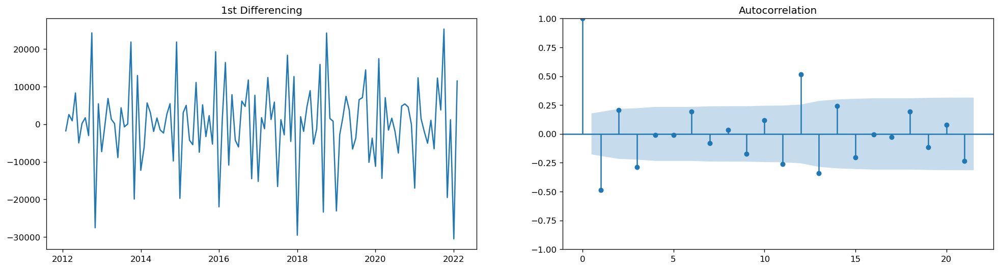

In [82]:
fig, axes = plt.subplots(1, 2, figsize=(20,5))
axes[0].plot(monthyr.monthyr_profit.diff()); axes[0].set_title('1st Differencing')
plot_acf(monthyr.monthyr_profit.diff().dropna(), ax=axes[1])
plt.show()


In [83]:
#p= 3 based on PACF, d=1 differencing once, q=1 from autocorrelation plot
from statsmodels.tsa.arima.model import ARIMA

model = ARIMA(monthyr.monthyr_profit,
              order=(5,1,1))
model_fit = model.fit()  #model_fit = model.fit(disp=0)
print(model_fit.summary())


/Users/amandamanfredo/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/amandamanfredo/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/amandamanfredo/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



                               SARIMAX Results                                
Dep. Variable:         monthyr_profit   No. Observations:                  122
Model:                 ARIMA(5, 1, 1)   Log Likelihood               -1263.599
Date:                Mon, 28 Mar 2022   AIC                           2541.197
Time:                        15:20:50   BIC                           2560.768
Sample:                    01-01-2012   HQIC                          2549.146
                         - 02-01-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7776      0.393     -1.978      0.048      -1.548      -0.007
ar.L2         -0.4239      0.270     -1.572      0.116      -0.953       0.105
ar.L3         -0.5677      0.155     -3.654      0.0

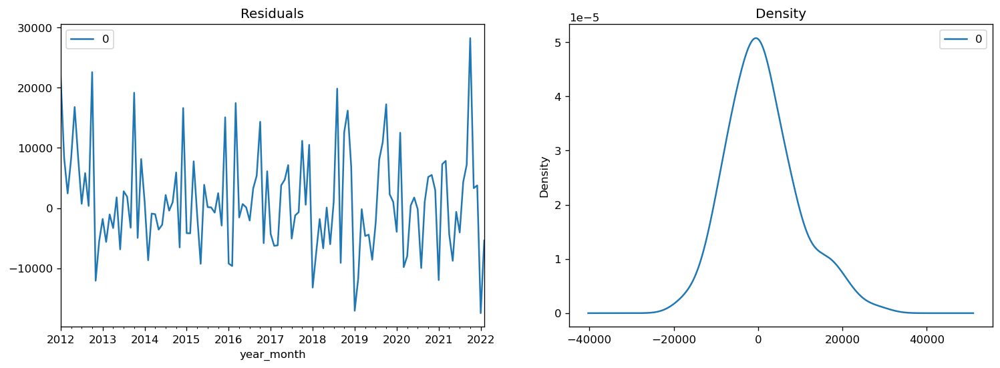

In [84]:
residuals = pd.DataFrame(model_fit.resid)
fig, ax = plt.subplots(1,2, figsize=(15,5))
residuals.plot(title="Residuals", ax=ax[0])
residuals.plot(kind='kde', title='Density', ax=ax[1])
plt.show()

Text(0, 0.5, 'Sale Profits')

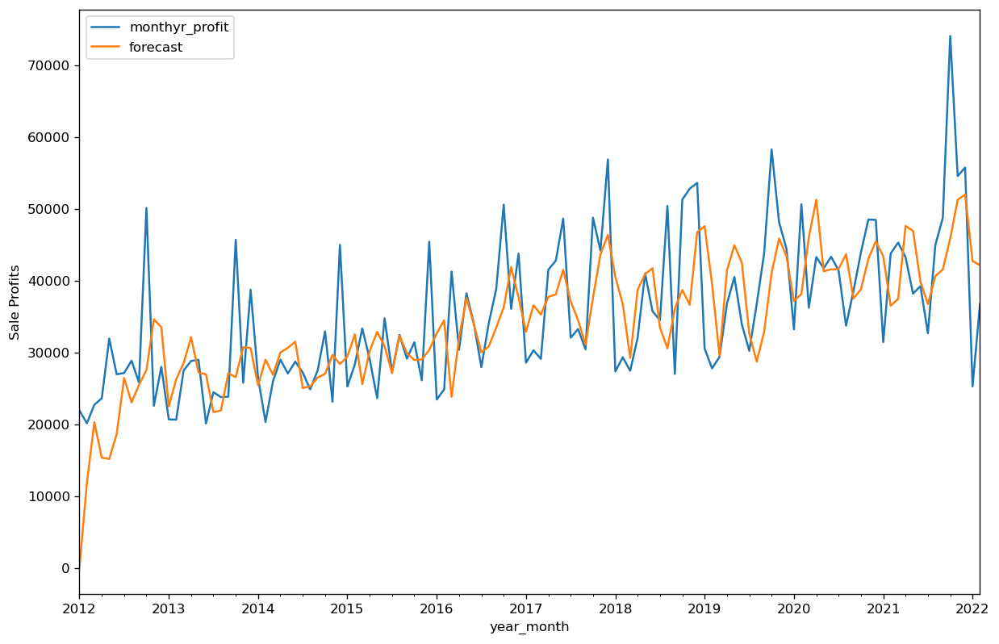

In [85]:
# Actual vs Fitted
monthyr['forecast']=model_fit.predict(dynamic=False)
monthyr[['monthyr_profit','forecast']].plot(figsize=(12,8), linewidth=1.5)
plt.ylabel('Sale Profits')

<AxesSubplot:>

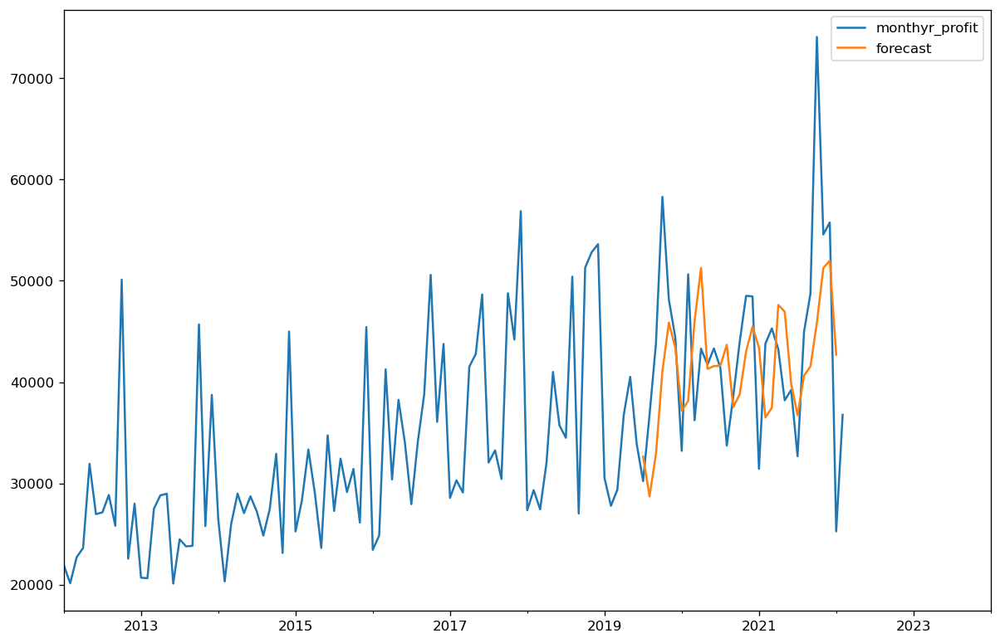

In [86]:
#another way to plot actual vs predicted that hopefully shows forecast
from pandas.tseries.offsets import DateOffset
pred_date=[monthyr.index[-1]+ DateOffset(months=x)for x in range(0,24)]
# Giving similar names to columns.

# Input:

pred_date=pd.DataFrame(index=pred_date[1:],columns=monthyr.columns)
pred_date

# monthyr['diff']=monthyr.monthyr_profit.diff().dropna()

monthyr=pd.concat([monthyr,pred_date])
monthyr['forecast'] = model_fit.predict(start = 90, end = 120, dynamic= False)
monthyr[['monthyr_profit', 'forecast']].plot(figsize=(12, 8), linewidth=1.5)

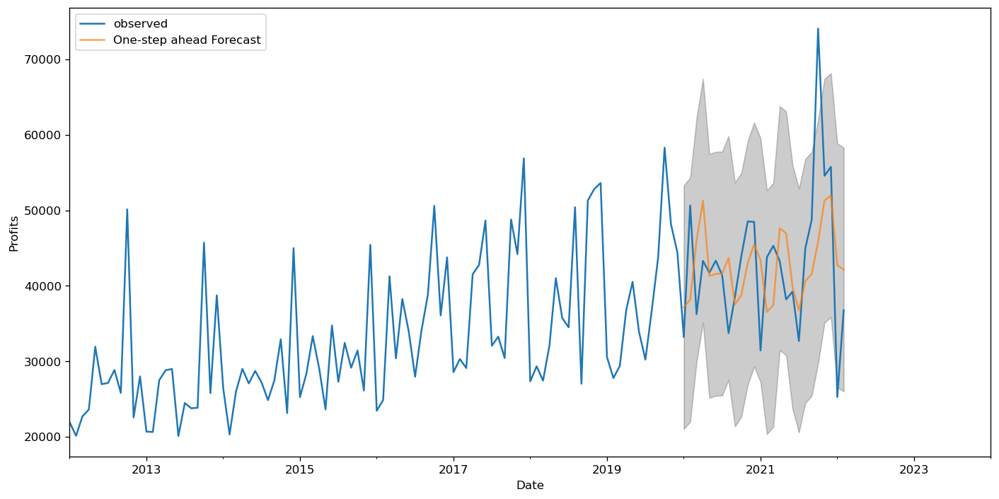

In [87]:
#pred = model_fit.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=False)

#update your data with the real values instead, you set dynamic=False
pred = model_fit.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=False)
pred_ci = pred.conf_int()
ax = monthyr.monthyr_profit['2012':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))

ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Profits')
plt.legend()
plt.show()


In [88]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
# model = SARIMAX(monthyr.monthyr_profit.diff().dropna(),order=(5,1,1), exogeneous=monthyr.index,
#               seasonal_order=(5,1,1,12),enforce_stationarity=True,
#               enforce_invertibility=False)
# results = model.fit()

model = SARIMAX(monthyr.monthyr_profit,order=(5,1,1), exogeneous=monthyr.index,
              seasonal_order=(5,1,1,12),enforce_stationarity=True,
              enforce_invertibility=False)
results = model.fit()

/Users/amandamanfredo/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/amandamanfredo/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



<AxesSubplot:>

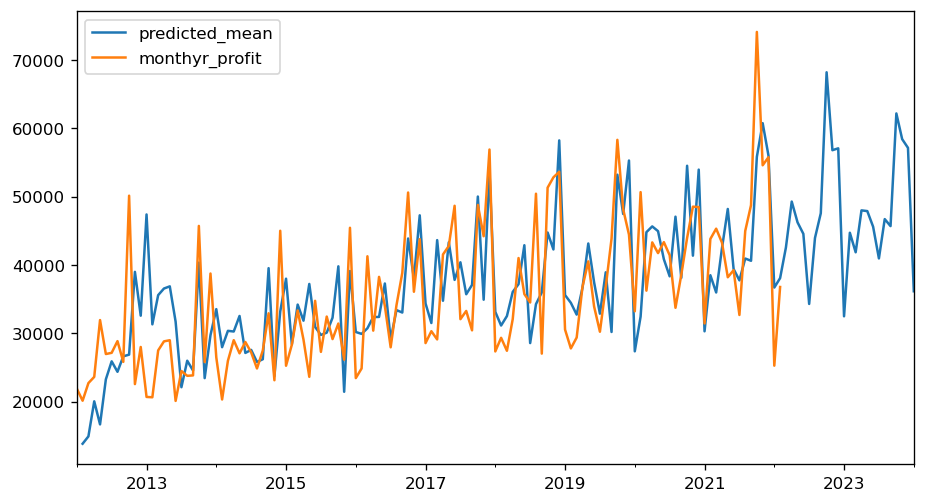

In [89]:
forecast = results.predict(dynamic=False)
forecast[1:].plot(linewidth=1.5,legend=True)
monthyr.monthyr_profit.plot(linewidth=1.5,legend=True)

# plt.ylabel('Sales Volume (Millions)');

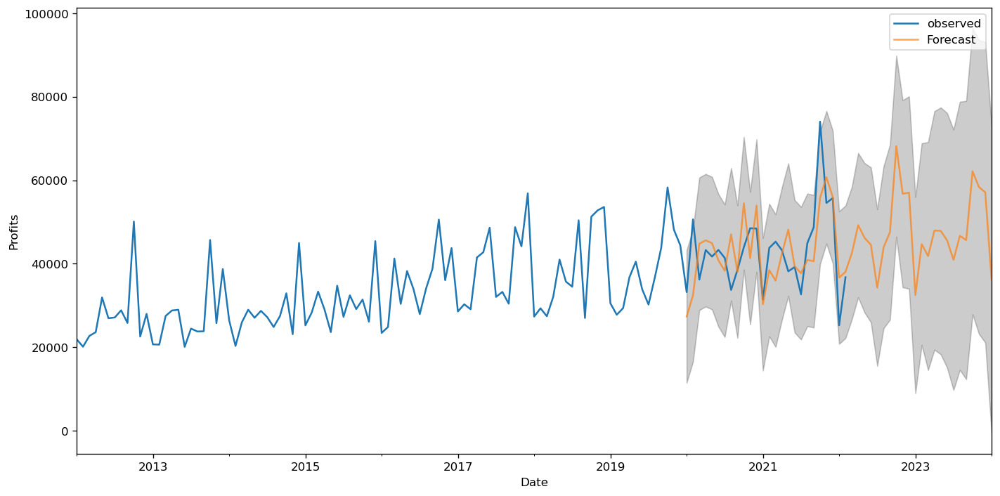

In [90]:
pred = results.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=False)
pred_ci = pred.conf_int()
ax = monthyr.monthyr_profit['2012':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Profits')
plt.legend()
plt.show()

In [92]:
df.columns

Index(['date', 'store_number', 'store_name', 'address', 'city', 'zip_code',
       'county', 'category_name', 'vendor_number', 'vendor_name',
       'item_description', 'pack', 'state_bottle_cost', 'state_bottle_retail',
       'bottles_sold', 'sale_dollars', 'volume_sold_liters',
       'Profit_per_bottle', 'Profit_per_sale', 'Store Type', 'LiquorType',
       'Bottle Size', 'Longitude', 'Latitude', 'day_name', 'year_month'],
      dtype='object')

# Stepwise Regression for important features

In [93]:
df1=df

In [94]:
#separate types of columns/features

categorical_features=['LiquorType', 'Store Type', 'Bottle Size', 'county', 'city']
numerical_features = ['pack', 'state_bottle_cost', 'state_bottle_retail','bottles_sold','volume_sold_liters',
                     'Longitude', 'Latitude']


In [95]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
# transform data
scaled = scaler.fit_transform(df1[numerical_features])
df1[numerical_features]=scaled

In [109]:
#dummifying the categorical features
dummy= pd.get_dummies(df1[categorical_features], drop_first=True)

#viewing dummy to make sure the values are correct
dummy

In [111]:
import statsmodels.api as sm
x=sm.add_constant(x)

In [112]:
x=pd.concat([dummy, df1[numerical_features]], axis=1)
y = np.log(df['Profit_per_sale']+1)

In [113]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test=train_test_split(x,y, test_size=.3)

In [114]:
import numpy as np

# def get_stats():
#   
results=sm.OLS(Y_train,X_train).fit()
print(results.summary())
# get_stats()

                            OLS Regression Results                            
Dep. Variable:        Profit_per_sale   R-squared:                       0.468
Model:                            OLS   Adj. R-squared:                  0.467
Method:                 Least Squares   F-statistic:                     409.2
Date:                Mon, 28 Mar 2022   Prob (F-statistic):               0.00
Time:                        15:25:58   Log-Likelihood:                -65761.
No. Observations:               59123   AIC:                         1.318e+05
Df Residuals:                   58995   BIC:                         1.329e+05
Df Model:                         127                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
LiquorType_beer           

In [115]:
pred=results.predict(X_test)

In [116]:
import sklearn.metrics as skl
skl.r2_score(Y_test, pred)

0.4162038119753827

In [117]:
x.isna().sum()

LiquorType_beer            0
LiquorType_brandy          0
LiquorType_cocktail mix    0
LiquorType_gifts           0
LiquorType_gin             0
LiquorType_liqueurs        0
LiquorType_mezcal          0
LiquorType_moonshine       0
LiquorType_rum             0
LiquorType_schnapps        0
LiquorType_tequila         0
LiquorType_vodka           0
LiquorType_whisky          0
Store Type_Drug Store      0
Store Type_Gas             0
Store Type_Liquor Store    0
Store Type_Supermarket     0
Bottle Size_1000           0
Bottle Size_200            0
Bottle Size_375            0
Bottle Size_750            0
Bottle Size_Other          0
Bottle Size_c              0
county_allamakee           0
county_appanoose           0
county_benton              0
county_black hawk          0
county_boone               0
county_bremer              0
county_buchanan            0
county_buena vist          0
county_buena vista         0
county_carroll             0
county_cass                0
county_cerro g

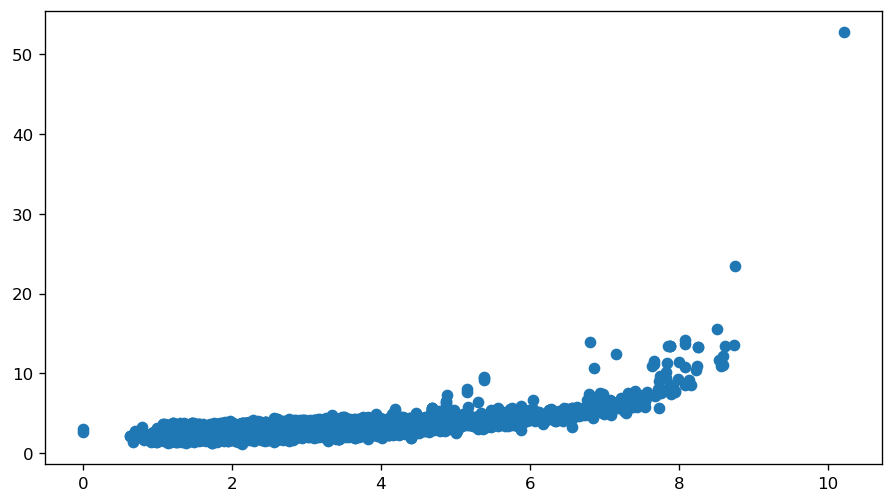

In [118]:
from sklearn import linear_model

lm = linear_model.LinearRegression() 
#generate fit of model base on training set

model = lm.fit(X_train, Y_train) 
#generate predicted values of y_test from X_test based off of training set
predictions = lm.predict(X_test)
#plotting predicted ys against y values in test set 
plt.scatter(Y_test, predictions)


# LassoCV Regession

Seeing if Lasso can help with feature selection

In [119]:
from sklearn.linear_model import LassoCV
from sklearn.model_selection import RepeatedKFold

cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
lasso = LassoCV(alphas=np.arange(0, 1, 0.01), cv=cv, n_jobs=-1)

#fitting the model
lasso.fit(X_train, Y_train)

lasso.score(X_train, Y_train)

In [122]:
lasso.score(X_test, Y_test)
#big difference between train and test set indicating overfitting

0.41610248998204113

Lasso picked 195 features and eliminated the other 0 features


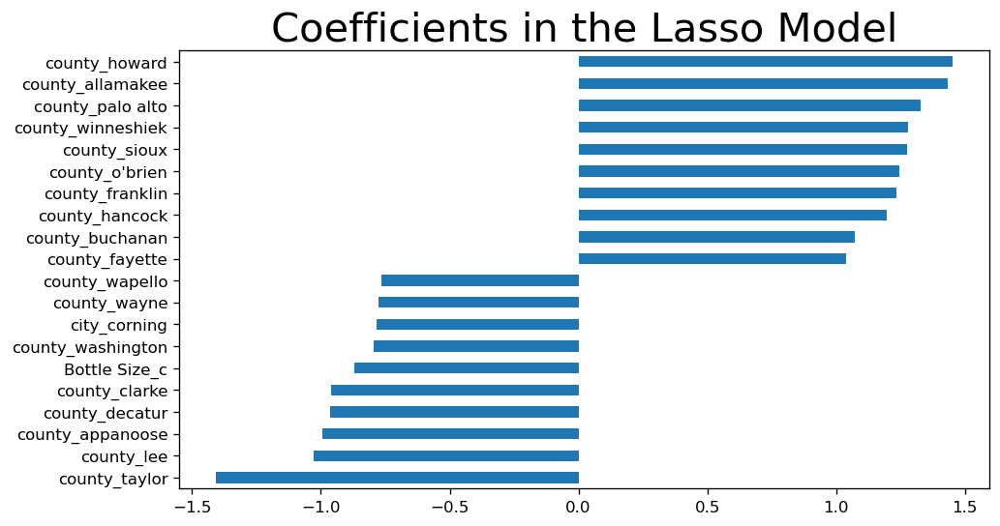

In [123]:
# Plot important coefficients of 2nd model
coefs1 = pd.Series(lasso.coef_, index = X_train.columns)
print("Lasso picked " + str(sum(coefs1 != 0)) + " features and eliminated the other " +  \
      str(sum(coefs1 == 0)) + " features")
imp_coefs = pd.concat([coefs1.sort_values().head(10),
                     coefs1.sort_values().tail(10)])
imp_coefs.plot(kind = "barh")
plt.title("Coefficients in the Lasso Model", fontsize=25)
plt.show()

#all the top coefficients are location related- county and city

In [ ]:
from sklearn import svm

classifiers = [
    svm.SVR(),
    linear_model.SGDRegressor(),
    linear_model.BayesianRidge(),
    linear_model.LassoLars(),
    linear_model.ARDRegression(),
    linear_model.PassiveAggressiveRegressor(),
    linear_model.TheilSenRegressor(),
    linear_model.LinearRegression()]


for item in classifiers:
    print(item)
    clf = item
    clf.fit(X_train, Y_train)
    print(clf.score(X_train, Y_train),'\n')
    print(clf.score(X_test, Y_test),'\n')

# Tree Based models

prepping the training data /n
features for tree models do not need to be standardized 

In [126]:
#Recreating the numerical and categorical features we have selected
num=df[numerical_features]
categ=df[categorical_features]


In [127]:
for col_name in categ.columns:
    if(categ[col_name].dtype == 'object'):
        categ[col_name]= categ[col_name].astype('category')
        categ[col_name] = categ[col_name].cat.codes
categ

In [131]:
#creating the x and y data to train and test
treex=pd.concat([numerics, categ], axis=1)
treey=df['Profit_per_sale']

In [132]:
treex.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 84462 entries, 0 to 99998
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   pack                 84462 non-null  int32  
 1   state_bottle_cost    84462 non-null  float32
 2   state_bottle_retail  84462 non-null  float32
 3   bottles_sold         84462 non-null  int32  
 4   volume_sold_liters   84462 non-null  float32
 5   Longitude            84462 non-null  float64
 6   Latitude             84462 non-null  float64
 7   LiquorType           84462 non-null  int8   
 8   Store Type           84462 non-null  int8   
 9   Bottle Size          84462 non-null  int8   
 10  county               84462 non-null  int8   
 11  city                 84462 non-null  int8   
dtypes: float32(3), float64(2), int32(2), int8(5)
memory usage: 3.9 MB


# Decision Tree Regression

Builds regression or classification models in the form of a tree structure
Decision trees where the target variable can take continuous values (typically real numbers) are called regression trees.


In [167]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split

#splitting the data
X_train, X_test, y_train, y_test = train_test_split(treex,treey, 
test_size=0.30, random_state=0)

dt = DecisionTreeRegressor(random_state=0, criterion="mse")
dt.fit(X_train, y_train)

dt_scores = cross_val_score(dt, X_train, y_train, cv = 10)
print("mean cross validation score: {}".format(np.mean(dt_scores)))
print("score without cv: {}".format(dt.score(X_train, y_train)))

# R^2 score on the test set
from sklearn.metrics import r2_score
print(r2_score(y_test, dt.predict(X_test)))
print(dt.score(X_test, y_test))


mean cross validation score: 0.9099813225466509
score without cv: 1.0
0.9139086592464006
0.9139086592464006


In [168]:
#looking at the individual cv scores
dt_scores

array([0.92999711, 0.92792998, 0.98497743, 0.46396554, 0.98860507,
       0.97713742, 0.95063243, 0.98661225, 0.99564505, 0.89431095])

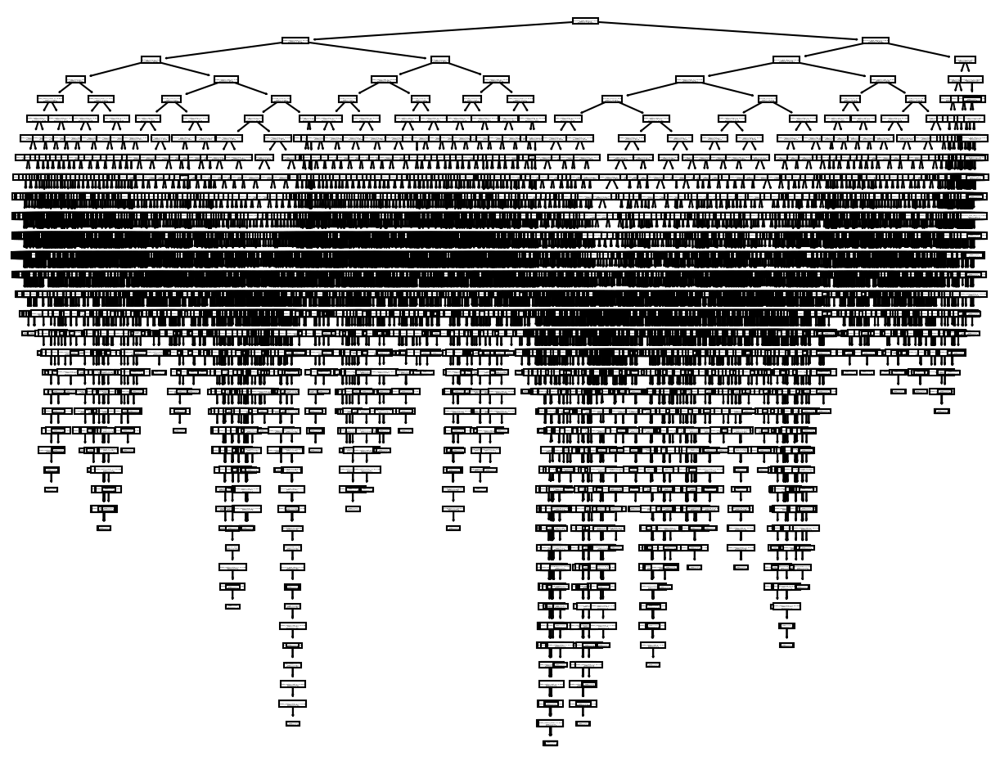

In [153]:
#plotting the decision tree model
from sklearn.tree import plot_tree
plt.figure(figsize=(10,8), dpi=150)
plot_tree(dt_fit, feature_names=treex.columns);

# Random Forest Regression
-Combines the predictions from multiple machine learning algorithms together to make more accurate predictions than any individual model.

In [169]:
from sklearn.ensemble import RandomForestRegressor

#creating the tree
rf = RandomForestRegressor(random_state=0, criterion="mse")
rf.fit(X_train, y_train)

#performing cross validation
rf_scores = cross_val_score(rf, X_train, y_train, cv = 10)
print("mean cross validation score: {}".format(np.mean(rf_scores)))
print("score without cv: {}".format(rf.score(X_train, y_train)))

# Scores on the test or hold-out set
from sklearn.metrics import r2_score
print(r2_score(y_test, rf.predict(X_test)))
print(rf.score(X_test, y_test))


mean cross validation score: 0.8532404180124514
score without cv: 0.951025895677923
0.9253584844806794
0.9253584844806794


In [170]:
'''Running a comprehensive Gridsearch for Random Forest'''

#Creating the parameters for gridsearch
randomparams={'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}



rfcv = GridSearchCV(estimator = rf, param_grid = randomparams, cv = 3, n_jobs = -1)

rfcv.fit(X_train, y_train)
print(r2_score(y_test, rfcv.predict(X_test)))
print(rfcv.score(X_test, y_test))

# Training Cluster models:KMeans

In [187]:
from kneed import KneeLocator
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler


kmeans = KMeans(
init="random",
n_clusters=3,
n_init=10,
max_iter=300,
    random_state=42)


kmeans.fit(X_train, Y_train)

# The number of iterations required to converge
kmeans.n_iter_   

20

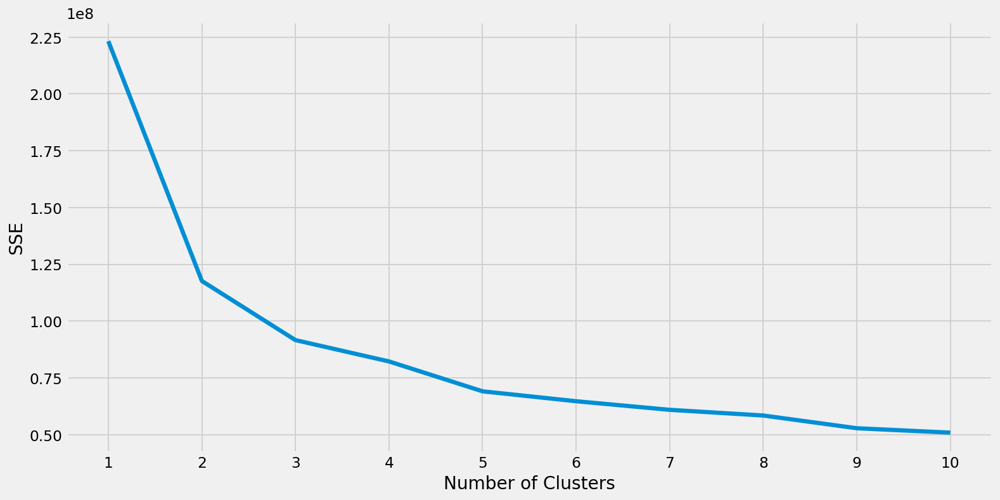

In [188]:
kmeans_kwargs = {
 "init": "random", "n_init": 10,"max_iter": 300,"random_state": 42}


sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(numerics)
    sse.append(kmeans.inertia_)


plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [189]:
kl = KneeLocator(
range(1, 11), sse, curve="convex", direction="decreasing")

k=kl.elbow
k

3